Sources: 
- [a](https://hifld-geoplatform.opendata.arcgis.com/datasets/hospitals/data)
- [b](https://www.infoplease.com/us/postal-information/state-abbreviations-and-state-postal-codes)
- [c](https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.html)
- [d](https://www.rdocumentation.org/packages/statesRcontiguous/versions/0.1.0)
- [voronoi to polygons](https://stackoverflow.com/questions/27548363/from-voronoi-tessellation-to-shapely-polygons)
- [intersect gpd](http://maths.straylight.co.uk/archives/1257)

In [1]:
import pandas as pd

census = pd.read_csv('./utf-8-census.txt')
hospital = pd.read_csv('./Hospitals.csv')
zip_codes = pd.read_csv('./Geocodes_USA_with_Counties.csv')
zip_codes['ZIP'] = zip_codes['zip']
zip_codes.drop('zip', axis=1)

,primary_city,state,latitude,longitude,county,type,world_region,country,decommissioned,estimated_population,notes,ZIP
0,Holtsville,NY,40.81,-73.04,Suffolk,UNIQUE,NaN,US,0,384,NaN,501
1,Holtsville,NY,40.81,-73.04,Suffolk,UNIQUE,NaN,US,0,0,NaN,544
2,Adjuntas,PR,18.16,-66.72,Adjuntas,STANDARD,NaN,US,0,0,NaN,601
3,Aguada,PR,18.38,-67.18,NaN,STANDARD,NaN,US,0,0,NaN,602
4,Aguadilla,PR,18.43,-67.15,Aguadilla,STANDARD,NaN,US,0,0,NaN,603
5,Aguadilla,PR,18.43,-67.15,NaN,PO BOX,NaN,US,0,0,NaN,604
6,Aguadilla,PR,18.43,-67.15,NaN,PO BOX,NaN,US,0,0,NaN,605
7,Maricao,PR,18.18,-66.98,Maricao,STANDARD,NaN,US,0,0,NaN,606
8,Anasco,PR,18.28,-67.14,NaN,STANDARD,NaN,US,0,0,NaN,610
9,Angeles,PR,18.28,-66.79,NaN,PO BOX,NaN,US,0,0,"no NWS data,",611


In [2]:
hospital.columns.values

array(['X', 'Y', 'OBJECTID', 'ID', 'NAME', 'ADDRESS', 'CITY', 'STATE',
       'ZIP', 'ZIP4', 'TELEPHONE', 'TYPE', 'STATUS', 'POPULATION',
       'COUNTY', 'COUNTYFIPS', 'COUNTRY', 'LATITUDE', 'LONGITUDE',
       'NAICS_CODE', 'NAICS_DESC', 'SOURCE', 'SOURCEDATE', 'VAL_METHOD',
       'VAL_DATE', 'WEBSITE', 'STATE_ID', 'ALT_NAME', 'ST_FIPS', 'OWNER',
       'TTL_STAFF', 'BEDS', 'TRAUMA', 'HELIPAD'], dtype=object)

In [3]:
# join
zip_codes_and_hospitals = zip_codes.merge(hospital, how='outer', on='ZIP').dropna(subset=['BEDS', 'county'])
zip_codes_and_hospitals

,zip,primary_city,state,latitude,longitude,county,type,world_region,country,decommissioned,...,VAL_DATE,WEBSITE,STATE_ID,ALT_NAME,ST_FIPS,OWNER,TTL_STAFF,BEDS,TRAUMA,HELIPAD
173,929.0,San Juan,PR,18.40,-66.06,San Juan,PO BOX,NaN,US,0.0,...,2014-02-10T00:00:00.000Z,http://www.sanpablo.com,221,NOT AVAILABLE,72.0,PROPRIETARY,-999.0,150.0,NOT AVAILABLE,N
185,939.0,San Juan,PR,18.40,-66.06,San Juan,UNIQUE,NaN,US,0.0,...,2014-02-10T00:00:00.000Z,NOT AVAILABLE,184,NOT AVAILABLE,72.0,PROPRIETARY,-999.0,250.0,NOT AVAILABLE,N
194,956.0,Bayamon,PR,18.28,-66.13,BayamÃƒÂ³n,STANDARD,NaN,US,0.0,...,2014-03-12T00:00:00.000Z,NOT AVAILABLE,41,NOT AVAILABLE,72.0,GOVERNMENT - STATE,-999.0,102.0,NOT AVAILABLE,Y
220,984.0,Carolina,PR,18.40,-65.98,Carolina,PO BOX,NaN,US,0.0,...,2014-02-12T00:00:00.000Z,http://www.hospitalupr.org/,57,NOT AVAILABLE,72.0,NOT AVAILABLE,-999.0,-999.0,NOT AVAILABLE,N
256,1040.0,Holyoke,MA,42.21,-72.64,Hampden,STANDARD,NaN,US,0.0,...,2014-02-10T00:00:00.000Z,http://www.mercycares.com/pages.asp?id=514,2150,PROVIDENCE BEHAVIORAL HEALTH HOSPITAL,25.0,NON-PROFIT,-999.0,131.0,NOT AVAILABLE,N
257,1040.0,Holyoke,MA,42.21,-72.64,Hampden,STANDARD,NaN,US,0.0,...,2014-02-10T00:00:00.000Z,http://www.holyokehealth.com,2145,HOLYOKE MEDICAL CENTER,25.0,NON-PROFIT,-999.0,198.0,NOT AVAILABLE,N
260,1053.0,Leeds,MA,42.35,-72.71,Hampshire,STANDARD,NaN,US,0.0,...,2013-12-16T00:00:00.000Z,http://www.centralwesternmass.va.gov/,NOT AVAILABLE,NORTHAMPTON VA,25.0,GOVERNMENT - FEDERAL,-999.0,-999.0,NOT AVAILABLE,N
262,1056.0,Ludlow,MA,42.16,-72.48,Hampden,STANDARD,NaN,US,0.0,...,2016-08-01T00:00:00.000Z,http://www.healthsouthrehab.org/en/our-hospital,2912,NOT AVAILABLE,25.0,PROPRIETARY,-999.0,53.0,NOT AVAILABLE,N
266,1061.0,Northampton,MA,42.32,-72.67,Hampshire,PO BOX,NaN,US,0.0,...,2014-02-10T00:00:00.000Z,http://www.cooley-dickinson.org,2155,COOLEY DICKINSON HOSPITAL,25.0,NON-PROFIT,-999.0,140.0,NOT AVAILABLE,Y
267,1062.0,Florence,MA,42.32,-72.67,Hampshire,STANDARD,NaN,US,0.0,...,2015-05-20T00:00:00.000Z,http://www.centralwesternmass.va.gov/,NOT AVAILABLE,NOT AVAILABLE,25.0,GOVERNMENT - FEDERAL,-999.0,-999.0,NOT AVAILABLE,N


In [4]:
census['county_state'] = census['CTYNAME'].apply(lambda s: " ".join(s.split(" ")[:-1])).astype(str) + census['STNAME'].astype(str)

In [5]:
with open('./post_codes.txt') as fp:
    lines = fp.readlines()
    
code2state = pd.DataFrame(list(map(lambda s: s.split("\t"), lines))).drop([0, 1])
code2state['state name'] = code2state[0]
code2state['state'] = code2state[2].apply(lambda s: s.split('\n')[0])
code2state = code2state.drop([0, 1, 2], axis=1)

In [6]:
df = zip_codes_and_hospitals.merge(code2state, on='state', how='outer')
df['county_state'] = df['county'] + df['state name']
df

,zip,primary_city,state,latitude,longitude,county,type,world_region,country,decommissioned,...,STATE_ID,ALT_NAME,ST_FIPS,OWNER,TTL_STAFF,BEDS,TRAUMA,HELIPAD,state name,county_state
0,929.0,San Juan,PR,18.40,-66.06,San Juan,PO BOX,NaN,US,0.0,...,221,NOT AVAILABLE,72.0,PROPRIETARY,-999.0,150.0,NOT AVAILABLE,N,Puerto Rico,San JuanPuerto Rico
1,939.0,San Juan,PR,18.40,-66.06,San Juan,UNIQUE,NaN,US,0.0,...,184,NOT AVAILABLE,72.0,PROPRIETARY,-999.0,250.0,NOT AVAILABLE,N,Puerto Rico,San JuanPuerto Rico
2,956.0,Bayamon,PR,18.28,-66.13,BayamÃƒÂ³n,STANDARD,NaN,US,0.0,...,41,NOT AVAILABLE,72.0,GOVERNMENT - STATE,-999.0,102.0,NOT AVAILABLE,Y,Puerto Rico,BayamÃƒÂ³nPuerto Rico
3,984.0,Carolina,PR,18.40,-65.98,Carolina,PO BOX,NaN,US,0.0,...,57,NOT AVAILABLE,72.0,NOT AVAILABLE,-999.0,-999.0,NOT AVAILABLE,N,Puerto Rico,CarolinaPuerto Rico
4,1040.0,Holyoke,MA,42.21,-72.64,Hampden,STANDARD,NaN,US,0.0,...,2150,PROVIDENCE BEHAVIORAL HEALTH HOSPITAL,25.0,NON-PROFIT,-999.0,131.0,NOT AVAILABLE,N,Massachusetts,HampdenMassachusetts
5,1040.0,Holyoke,MA,42.21,-72.64,Hampden,STANDARD,NaN,US,0.0,...,2145,HOLYOKE MEDICAL CENTER,25.0,NON-PROFIT,-999.0,198.0,NOT AVAILABLE,N,Massachusetts,HampdenMassachusetts
6,1053.0,Leeds,MA,42.35,-72.71,Hampshire,STANDARD,NaN,US,0.0,...,NOT AVAILABLE,NORTHAMPTON VA,25.0,GOVERNMENT - FEDERAL,-999.0,-999.0,NOT AVAILABLE,N,Massachusetts,HampshireMassachusetts
7,1056.0,Ludlow,MA,42.16,-72.48,Hampden,STANDARD,NaN,US,0.0,...,2912,NOT AVAILABLE,25.0,PROPRIETARY,-999.0,53.0,NOT AVAILABLE,N,Massachusetts,HampdenMassachusetts
8,1061.0,Northampton,MA,42.32,-72.67,Hampshire,PO BOX,NaN,US,0.0,...,2155,COOLEY DICKINSON HOSPITAL,25.0,NON-PROFIT,-999.0,140.0,NOT AVAILABLE,Y,Massachusetts,HampshireMassachusetts
9,1062.0,Florence,MA,42.32,-72.67,Hampshire,STANDARD,NaN,US,0.0,...,NOT AVAILABLE,NOT AVAILABLE,25.0,GOVERNMENT - FEDERAL,-999.0,-999.0,NOT AVAILABLE,N,Massachusetts,HampshireMassachusetts


In [7]:
all_df = df.merge(census, on='county_state', how='outer')

In [8]:
keep_columns = ['zip', 'primary_city', 'state', 
       'county', 'type',
       'estimated_population', 'X', 'Y',
       'NAME', 'ADDRESS', 'TYPE',
                'POPULATION',
         'NAICS_DESC',
        'OWNER', 'BEDS', 'TRAUMA',
       'HELIPAD',
                'TTL_STAFF',
        'STNAME',
        'POPESTIMATE2018'
       ]

s_df = all_df[keep_columns].dropna()
s_df = s_df[s_df['BEDS'] != -999]

In [9]:
def bedsPerCapita(state, county = None, verbose=False):
    data = s_df[(s_df['state'] == state)]
    if county:
        data = s_df[(s_df['state'] == state) & (s_df['county'] == county)]
    if verbose:
        return data
    return ((sum(data['BEDS'])/sum(data['POPESTIMATE2018'].unique())), len(data['BEDS']))

In [10]:
# bedsPerCapita('NY', 'New York', verbose=True)

Now we have a geographic distribution of beds. Now we need to calculate the number of people each hospital serves. This is actually a Voronoi diagram.

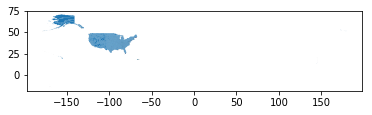

In [15]:
import geopandas as gpd
from shapely.geometry import Point, Polygon

PATH = 'cb_2018_us_county_within_cd116_500k.shx'

usa = gpd.read_file(PATH)
usa.plot()

In [16]:
crs = {'init': 'epsg:4326'}
geometry = [Point(xy) for xy in zip(s_df['X'], s_df['Y'])]
geo_df = gpd.GeoDataFrame(s_df, crs = crs, geometry = geometry)
geo_df.head()

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pyproj/crs/crs.py:55: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,zip,primary_city,state,county,type,estimated_population,X,Y,NAME,ADDRESS,...,POPULATION,NAICS_DESC,OWNER,BEDS,TRAUMA,HELIPAD,TTL_STAFF,STNAME,POPESTIMATE2018,geometry
4,1040.0,Holyoke,MA,Hampden,STANDARD,26316.0,-72.634000,42.165900,MERCY MEDICAL CENTER - PROVIDENCE BEHAVIORAL H...,1233 MAIN STREET,...,131.0,GENERAL MEDICAL AND SURGICAL HOSPITALS,NON-PROFIT,131.0,NOT AVAILABLE,N,-999.0,Massachusetts,470406.0,POINT (-72.63400 42.16590)
5,1040.0,Holyoke,MA,Hampden,STANDARD,26316.0,-72.627600,42.200300,HOLYOKE MEDICAL CENTER,575 BEECH STREET,...,198.0,GENERAL MEDICAL AND SURGICAL HOSPITALS,NON-PROFIT,198.0,NOT AVAILABLE,N,-999.0,Massachusetts,470406.0,POINT (-72.62760 42.20030)
6,1056.0,Ludlow,MA,Hampden,STANDARD,17529.0,-72.472077,42.155776,HEALTHSOUTH REHABILITATION HOSPITAL OF WESTERN...,222 STATE STREET,...,53.0,"REHABILITATION HOSPITALS (EXCEPT ALCOHOLISM, D...",PROPRIETARY,53.0,NOT AVAILABLE,N,-999.0,Massachusetts,470406.0,POINT (-72.47208 42.15578)
7,1069.0,Palmer,MA,Hampden,STANDARD,6950.0,-72.341800,42.169600,BAY STATE WING MEMORIAL HOSPITAL AND MEDICAL C...,40 WRIGHT STREET,...,74.0,GENERAL MEDICAL AND SURGICAL HOSPITALS,NON-PROFIT,74.0,NOT AVAILABLE,Y,-999.0,Massachusetts,470406.0,POINT (-72.34180 42.16960)
8,1085.0,Westfield,MA,Hampden,STANDARD,32344.0,-72.700910,42.110370,WESTERN MASSACHUSETTS HOSPITAL,91 EAST MOUNTAIN RD,...,100.0,SPECIALTY (EXCEPT PSYCHIATRIC AND SUBSTANCE AB...,GOVERNMENT - STATE,100.0,NOT AVAILABLE,N,-999.0,Massachusetts,470406.0,POINT (-72.70091 42.11037)


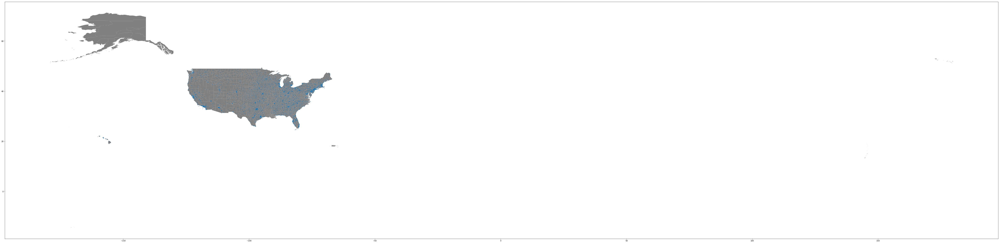

In [26]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))
ax1 = fig.add_subplot(111)

usa.plot(ax = ax1, color = 'grey')
geo_df.plot(ax=ax1, markersize = 1)
plt.savefig('plot.png')

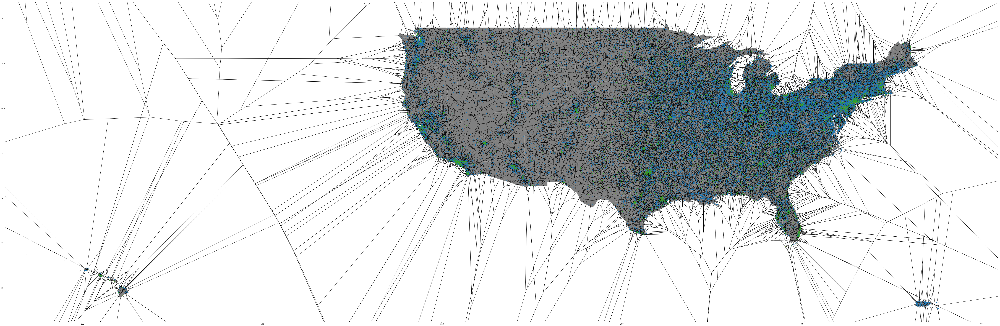

In [53]:
from scipy.spatial import Voronoi, voronoi_plot_2d

points = s_df[['X', 'Y']].values
hospital_vor = Voronoi(points)
voronoi_plot_2d(vor, ax = ax1, show_vertices=False)

In [51]:
fig.savefig("plot.png")

Let's lay out a grid of zipcodes, corresponding to population, and calculate which zip codes overlap with which zones in the Voronoi.

In [52]:
# turn the zip codes into a grid to overlay on top of us map
zip_code_points = [Point(xy) for xy in zip(zip_codes['longitude'], zip_codes['latitude'])]

zip_points_df = gpd.GeoDataFrame(zip_codes, crs = crs, geometry = zip_code_points)
zip_points_df.head()

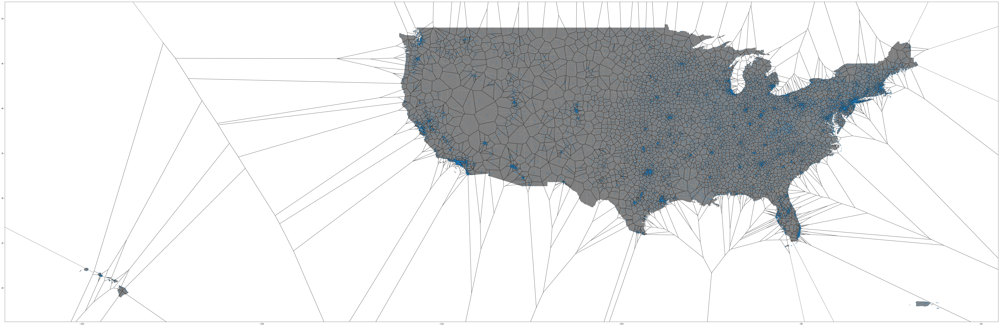

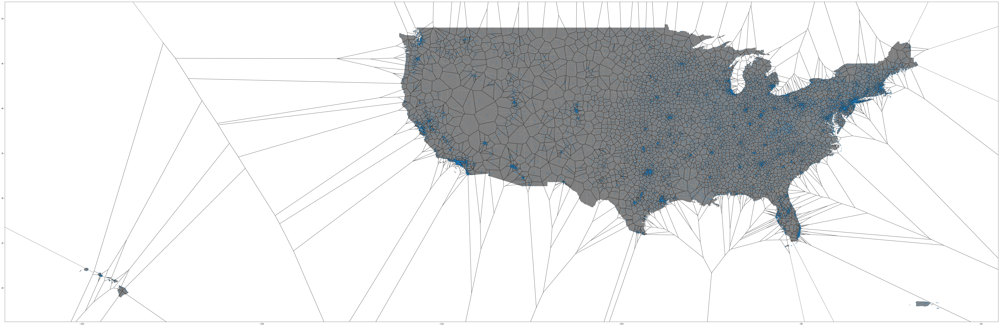

In [54]:
fig = plt.figure(figsize=(100,100))
ax1 = fig.add_subplot(111)

usa.plot(ax = ax1, color = 'grey')
zip_points_df.plot(ax=ax1, markersize = 1)

points = zip_points_df[['longitude', 'latitude']].values
zip_vor = Voronoi(points)
voronoi_plot_2d(vor, ax = ax1, show_vertices=False)

In [ ]:
zip_vor

In [48]:
fig.savefig("plot2.png")

In [84]:
from shapely.geometry import LineString
from shapely.ops import polygonize

lines = [
    LineString(hospital_vor.vertices[line])
    for line in hospital_vor.ridge_vertices
    if -1 not in line
]
hospital_polygons = [p for p in polygonize(lines)]

In [85]:
print(len(s_df))
len(hospital_polygons)

6427


6397